In [1]:
import ROOT
from sys import exit
import numpy as np
from numpy.testing import assert_array_equal
from nose.tools import (raises, assert_raises, assert_true,
                        assert_equal, assert_almost_equal)
import root_numpy as rnp
import pandas as pd
from pandas.plotting import scatter_matrix
ROOT.ROOT.EnableImplicitMT()

from sklearn import preprocessing

import torch as torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim

data_in = rnp.root2array("../data/pyTreeFatFat_train.root","pytree",
                         branches=['e0','e1','e2','e3','e4','e5','e6','x','m','dt','gmult','ge','gid','glabel'])
assert_equal(data_in.dtype.names, ('e0','e1','e2','e3','e4','e5','e6','x','m','dt','gmult','ge','gid','glabel'))

#convert to pandas
df = pd.DataFrame(data=data_in)
x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))
x_scaled = min_max_scaler.fit_transform(x)
res_df = pd.DataFrame(x_scaled)
df_g1293 = df[(df['ge'] > 1280) & (df['ge'] < 1305)]
g1293_tot = df_g1293.size/14
print(g1293_tot)
print(df)
print(res_df)

#data to torch tensor
X = torch.from_numpy(res_df.values).float().to(torch.device('cpu'))
print(X.shape)
print(X)


Welcome to JupyROOT 6.18/04
11044.0
                e0           e1           e2           e3           e4  \
0      2077.941895  1270.559204  1880.864014  3348.500977  3958.805908   
1      1747.946655   882.959229  1158.864014  2630.905762  2906.810547   
2      1725.633789  1143.359253  1239.864014  2868.993164  2965.497803   
3      2107.300781  1223.759155  1764.864014  3331.060059  3872.164795   
4      1696.274780  1112.159180  1200.864014  2808.434082  2897.138672   
...            ...          ...          ...          ...          ...   
58589  1971.391602  1223.043457  1587.869019  3194.435059  3559.260742   
58590  1806.815674  1048.813477  1395.869019  2855.629150  3202.684570   
58591  1579.967651   732.273499   953.869019  2312.241211  2533.836670   
58592  1654.471680   921.133484  1175.869019  2575.605225  2830.340820   
58593  1380.919678   615.233459   739.869019  1996.153076  2120.788574   

                e5           e6           x            m    dt  gmult  \
0 

In [2]:
#look at data loaded
import matplotlib.pyplot as plt
import plotly.express as px

plt.figure(figsize=(5,2))
fig = px.histogram(df, x="glabel",nbins=8, color="glabel")
fig.update_xaxes(range=[-1, 5])
fig.show()

fig = px.histogram(df, x="ge",nbins=3000, color="glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()

fig = px.scatter(df, x="e4",y="e0",color="glabel",opacity=0.5)
fig.show()


In [3]:
#plt.figure(figsize=(10,4))
#scatter_matrix(df, alpha=0.8, figsize=(4,4), diagonal='kde')
#plt.show()

import seaborn as sns
sns.set(style="ticks")

#sns.pairplot(df, hue="glabel", vars=["e0", "e4", "e6", "x", "m","gmult"])

In [4]:
class Net(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(11, 40)
        self.relu1 = nn.ReLU()
        self.dout = nn.Dropout(0.2)
        self.fc2 = nn.Linear(40, 20)
        self.prelu = nn.PReLU(1)
        self.out = nn.Linear(20, 1)
        self.out_act = nn.Sigmoid()
        
    def forward(self, input_):
        a1 = self.fc1(input_)
        h1 = self.relu1(a1)
        dout = self.dout(h1)
        a2 = self.fc2(dout)
        h2 = self.prelu(a2)
        a3 = self.out(h2)
        y = self.out_act(a3)
        return y
    
net = Net()
opt = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999))
criterion = nn.BCELoss()

In [5]:
def train_epoch(model, opt, criterion, batch_size=500):
    model.train()
    losses = []
    correct = 0
    total = 0
    for beg_i in range(0, X.size(0), batch_size):
        x_batch = X[beg_i:beg_i + batch_size, 0:11]
        #print(x_batch)
        y_batch = X[beg_i:beg_i + batch_size, 12:13]
        #print(y_batch.shape)
        x_batch = Variable(x_batch)
        y_batch = Variable(y_batch)
        
        opt.zero_grad()
        # (1) Forward
        y_hat = net(x_batch)
        #
        # (2) Percent test on batch
        with torch.no_grad():
            y_round = torch.round(y_hat)
            total += y_batch.size(0)
            correct += (y_round == y_batch).sum().item()
            
                
        # (3) Compute diff
        loss = criterion(y_hat, y_batch)
        
        # (3) Compute gradients
        loss.backward()
        
        # (4) update weights
        opt.step()        
        losses.append(loss.data.numpy())
    
    print('Accuracy of the network on the current batch of data: %f %%' % (
        100 * correct / total))
    return losses

In [6]:
e_losses = []
num_epochs = 200
for e in range(num_epochs):
    e_losses += train_epoch(net, opt, criterion)

Accuracy of the network on the current batch of data: 58.113459 %
Accuracy of the network on the current batch of data: 58.444551 %
Accuracy of the network on the current batch of data: 61.033553 %
Accuracy of the network on the current batch of data: 64.591938 %
Accuracy of the network on the current batch of data: 67.174113 %
Accuracy of the network on the current batch of data: 69.172612 %
Accuracy of the network on the current batch of data: 70.029355 %
Accuracy of the network on the current batch of data: 71.126737 %
Accuracy of the network on the current batch of data: 71.551695 %
Accuracy of the network on the current batch of data: 71.998839 %
Accuracy of the network on the current batch of data: 72.227532 %
Accuracy of the network on the current batch of data: 72.647370 %
Accuracy of the network on the current batch of data: 72.894836 %
Accuracy of the network on the current batch of data: 73.167901 %
Accuracy of the network on the current batch of data: 73.388060 %
Accuracy o

Accuracy of the network on the current batch of data: 75.149333 %
Accuracy of the network on the current batch of data: 75.162986 %
Accuracy of the network on the current batch of data: 75.325119 %
Accuracy of the network on the current batch of data: 75.261972 %
Accuracy of the network on the current batch of data: 75.123733 %
Accuracy of the network on the current batch of data: 75.296105 %
Accuracy of the network on the current batch of data: 75.357545 %
Accuracy of the network on the current batch of data: 75.128853 %
Accuracy of the network on the current batch of data: 75.226132 %
Accuracy of the network on the current batch of data: 75.142506 %
Accuracy of the network on the current batch of data: 75.217599 %
Accuracy of the network on the current batch of data: 75.151039 %
Accuracy of the network on the current batch of data: 75.198826 %
Accuracy of the network on the current batch of data: 75.224426 %
Accuracy of the network on the current batch of data: 75.156159 %
Accuracy o

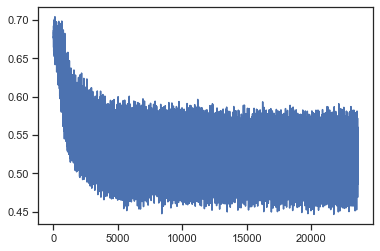

In [7]:
plt.plot(e_losses)
#print(net.parameters)
#print(net.state_dict())
#save_path="./model_saves/march15.pt"
#torch.save(net, "./model_saves/march15.pt")
#model = torch.load(save_path)
#model.eval()

In [8]:
net.eval()
with torch.no_grad():
    result = net(X[0:100000,0:11])
    #result = torch.round(result)

In [9]:
#plt.plot(result.data)
print(torch.max(result))
print(torch.min(result))
torch.histc(result)
#print(result.data)

df_F = pd.DataFrame(data=result.numpy())
#print(df_F)
df_F.columns = ["A"]

fig = px.histogram(df_F,x="A",nbins=100)
fig.update_xaxes(range=[0.0,1.0])
fig.show()

tensor(0.9462)
tensor(0.1017)


In [10]:
#pull out events from model decision
result_df = pd.concat([df, df_F], axis=1)
#pull out events from model decision
#dump to csv
result_df.to_csv("pyTreeFatFat_train.csv",sep=" ",header=False)
#print(result_df)



In [13]:
#print(result_df)
s38_low=0.6
cl38_high=0.3
s38 = result_df[(result_df['A'] > s38_low) & (result_df['A'] < 1)]
cl38 = result_df[(result_df['A'] < cl38_high) & (result_df['A'] < 1)]
misc = result_df[(result_df['A'] > cl38_high) & (result_df['A'] < s38_low)]

g1293a = result_df[(result_df['A'] > s38_low) & (result_df['ge'] >1280) 
                   & (result_df['ge'] < 1300)]
g1293_s38 = g1293a.size/15
g1293b = result_df[(result_df['A'] < cl38_high) & (result_df['ge'] >1280) 
                   & (result_df['ge'] < 1300)]
g1293_cl38 = g1293b.size/15
g1293c = result_df[(result_df['A'] > cl38_high) & (result_df['A'] < s38_low)
                   & (result_df['ge'] >1280) & (result_df['ge'] < 1300)]
g1293_misc = g1293c.size/15

#print(s38.size/10)
print("1293 gamma rays for 38S: %d/%d*100.0 = %2.1f %%" 
      % (g1293_s38,g1293_tot,g1293_s38/g1293_tot*100.0))
print("1293 gamma rays for 38Cl: %d/%d*100.0 = %2.1f %%" 
      % (g1293_cl38,g1293_tot,g1293_cl38/g1293_tot*100.0))
print("1293 gamma rays for Misc: %d/%d*100.0 = %2.1f %%" 
      % (g1293_misc,g1293_tot,g1293_misc/g1293_tot*100.0))
print("Sum 1293 gamma rays: %d" % (g1293_s38+g1293_cl38+g1293_misc))


plt.figure(figsize=(10,4))
fig = px.histogram(s38, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()

plt.figure(figsize=(10,4))
fig = px.histogram(cl38, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()

plt.figure(figsize=(10,4))
fig = px.histogram(misc, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()


1293 gamma rays for 38S: 7090/11044*100.0 = 64.2 %
1293 gamma rays for 38Cl: 1565/11044*100.0 = 14.2 %
1293 gamma rays for Misc: 2389/11044*100.0 = 21.6 %
Sum 1293 gamma rays: 11044


<Figure size 720x288 with 0 Axes>

<Figure size 720x288 with 0 Axes>

<Figure size 720x288 with 0 Axes>